## Visualization of La Palma Earthquake Data

Using the subset of IGN data specific to La Palma. This subset was prepared using `screening.ipynb` and saved to `lapalma.csv`.

In [1]:
import pandas as pd
import altair as alt
alt.data_transformers.enable('default', max_rows=None)
import numpy as np

In [2]:
df = pd.read_csv('./lapalma.csv')

In [3]:
df['Time'] = df['UTC time']
df['timestamp'] = pd.to_numeric(pd.to_datetime(df['Date'] + ' ' + df['Time']))
df['Datetime'] = (df['Date'] + ' ' + df['Time']).apply(pd.to_datetime, format='%Y-%m-%d %H:%M:%S')
df.tail()

,Event,Date,UTC time,Local time(*),Latitude,Longitude,Depth(km),Magnitude,Mag. type,Max. int,Region,More Info,Time,timestamp,Datetime
9093,es2021rwszu,2021-09-12,07:23:16,08:23:16,28.5595,-17.8583,12.5,1.8,mbLg,NaN,N FUENCALIENTE DE LA PALMA.ILP,NaN,07:23:16,1631431396000000000,2021-09-12 07:23:16
9094,es2021rwswi,2021-09-12,07:19:17,08:19:17,28.5568,-17.8627,12.8,1.8,mbLg,NaN,N FUENCALIENTE DE LA PALMA.ILP,NaN,07:19:17,1631431157000000000,2021-09-12 07:19:17
9095,es2021rwsqe,2021-09-12,07:12:02,08:12:02,28.5624,-17.8637,12.5,1.8,mbLg,NaN,N FUENCALIENTE DE LA PALMA.ILP,NaN,07:12:02,1631430722000000000,2021-09-12 07:12:02
9096,es2021rwsks,2021-09-12,07:05:46,08:05:46,28.5659,-17.8406,9.7,1.8,mbLg,NaN,NE FUENCALIENTE DE LA PALMA.IL,NaN,07:05:46,1631430346000000000,2021-09-12 07:05:46
9097,es2021rupkb,2021-09-11,03:18:42,04:18:42,28.5675,-17.8705,10.6,1.5,mbLg,NaN,N FUENCALIENTE DE LA PALMA.ILP,NaN,03:18:42,1631330322000000000,2021-09-11 03:18:42


In [4]:
df.describe()

,Latitude,Longitude,Depth(km),Magnitude,More Info,timestamp
count,9098.000000,9098.000000,9098.000000,9098.000000,0.0,9.098000e+03
mean,28.566890,-17.839844,14.031875,2.682919,NaN,1.635794e+18
std,0.016284,0.021431,8.336468,0.512196,NaN,2.545203e+15
min,28.477500,-17.969500,0.000000,1.500000,NaN,1.631330e+18
25%,28.558400,-17.846600,10.300000,2.400000,NaN,1.634096e+18
50%,28.563600,-17.836900,11.300000,2.700000,NaN,1.635543e+18
75%,28.571000,-17.829100,13.500000,3.000000,NaN,1.637892e+18
max,28.697000,-17.705700,46.900000,5.100000,NaN,1.643823e+18


In [5]:
df['Depth'] = 'Crustal (<20km)'
df.loc[df['Depth(km)'] >= 20, 'Depth'] = 'Mantle (>20km)'

In [6]:
brush = alt.selection_interval(encodings=['x'])

bars = alt.Chart(df, width=700, height=150).mark_bar().encode(
    x=alt.X('Date:T', axis=alt.Axis(labelAngle=-45)),
    y=alt.Y('count():Q', title='Number of Events', axis=alt.Axis(labelAngle=-45)),
    color=alt.condition(brush, 'Depth:N', alt.value('lightgray'))
).properties(
    title='Earthquake event magnitude since 11 Sep 2021'
).add_selection(
    brush
)


detail_scatter = alt.Chart(df, width=700, height=350).mark_circle(opacity=0.3, strokeOpacity=1.0).encode(
    x=alt.X('Datetime:T', axis=alt.Axis(labelAngle=-45)),
    y=alt.Y('Depth(km):Q', axis=alt.Axis(labelAngle=-45),scale=alt.Scale(domain=[45, 0])),
    color=alt.condition(brush, 'Depth:N', alt.value('lightgray'), scale=alt.Scale(scheme='category10')),
    size=alt.Size('Magnitude:Q', scale=alt.Scale(type='log', domain=[1.5,6], range=[2,200]))
).properties(
    title='Number of Earthquakes per day since 11 Sep 2021'
).transform_filter(brush)


detail_scatter & bars

alt.VConcatChart(...)

In [7]:
brush = alt.selection_interval(encodings=['x'])

bars = alt.Chart(df, width=700, height=150).mark_bar().encode(
    x=alt.X('Date:T', axis=alt.Axis(labelAngle=-45)),
    y=alt.Y('count():Q', title='Number of Events', axis=alt.Axis(labelAngle=-45)),
    color=alt.condition(brush, 'Depth:N', alt.value('lightgray'))
).properties(
    title='Number of Earthquakes per day since 11 Sep 2021'
).add_selection(
    brush
)


detail_scatter = alt.Chart(df, width=700, height=500).mark_circle(opacity=0.3, strokeOpacity=1.0).encode(
    x=alt.X('Magnitude:Q', title='magnitude', axis=alt.Axis(labelAngle=-45), scale=alt.Scale(domain=[1.5, 6])),
    y=alt.Y('Depth(km):Q', axis=alt.Axis(labelAngle=-45),scale=alt.Scale(domain=[45, 0])),
    color=alt.condition(brush, 'Depth:N', alt.value('lightgray')),
    size=alt.Size('Magnitude:Q', scale=alt.Scale(type='log', domain=[1.5,6], range=[2,200]))
).properties(
    title='Number of Earthquakes per day since 11 Sep 2021'
).transform_filter(brush)


detail_scatter & bars

alt.VConcatChart(...)

In [8]:
brush = alt.selection_interval(encodings=['x'])

total_width = 1200
scatter_height = 500

bars = alt.Chart(df, width=total_width, height=150).mark_bar().encode(
    x=alt.X('Date:T', axis=alt.Axis(labelAngle=-45)),
    y=alt.Y('count():Q', title='Number of Events', axis=alt.Axis(labelAngle=-45)),
    color=alt.condition(brush, 'Depth:N', alt.value('lightgray'))
).properties(
    title='Number of Earthquakes per day since 11 Sep 2021'
).add_selection(
    brush
)


detail_scatter_long = alt.Chart(df, width=total_width/2, height=scatter_height).mark_circle(opacity=0.3, strokeOpacity=1.0).encode(
    x=alt.X('Longitude:Q', title='Longitude', axis=alt.Axis(labelAngle=-45),scale=alt.Scale(domain=[-18, -17.7])),
    y=alt.Y('Depth(km):Q', axis=alt.Axis(labelAngle=-45),scale=alt.Scale(domain=[45, 0])),
    size=alt.Size('Magnitude:Q', scale=alt.Scale(type='log', domain=[1.5,6], range=[2,200]))
).properties(
    title='Number of Earthquakes per day since 11 Sep 2021'
).transform_filter(brush)

detail_scatter_lat = alt.Chart(df, width=total_width/2, height=scatter_height).mark_circle(opacity=0.3, strokeOpacity=1.0).encode(
    x=alt.X('Latitude:Q', title='Latitude', axis=alt.Axis(labelAngle=-45),scale=alt.Scale(domain=[28.4, 28.7])),
    y=alt.Y('Depth(km):Q', axis=alt.Axis(labelAngle=-45),scale=alt.Scale(domain=[45, 0])),
    color=alt.Color('Magnitude:Q'),
    size=alt.Size('Magnitude:Q', scale=alt.Scale(type='log', domain=[1.5,5], range=[2,200]))
).properties(
    title='Number of Earthquakes per day since 11 Sep 2021'
).transform_filter(brush)


( detail_scatter_long | detail_scatter_lat ) & bars

alt.VConcatChart(...)

## X & Y versus depth - daily - swarms

In [9]:
brush = alt.selection_interval(encodings=['x'])

total_width = 1200
scatter_height = 500


bars = alt.Chart(df, width=total_width, height=150).mark_bar().encode(
    x=alt.X('Date:T', axis=alt.Axis(labelAngle=-45)),
    y=alt.Y('count():Q', title='Number of Events', axis=alt.Axis(labelAngle=-45)),
    color=alt.condition(brush, 'Swarm:N', alt.value('lightgray'))
).properties(
    title='Number of Earthquakes per day since 1 Jan 2017'
).add_selection(
    brush
)


detail_scatter_long = alt.Chart(df, width=total_width/2, height=scatter_height).mark_circle(opacity=0.6, strokeOpacity=1.0).encode(
    x=alt.X('Longitude:Q', title='Longitude', axis=alt.Axis(labelAngle=-45),scale=alt.Scale(domain=[-18, -17.7])),
    y=alt.Y('Depth(km):Q', axis=alt.Axis(labelAngle=-45),scale=alt.Scale(domain=[45, 0])),
    color=alt.Color('Swarm:N'),    
    size=alt.Size('Magnitude:Q', scale=alt.Scale(type='log', domain=[1.5,6], range=[2,200]))
).properties(
    title='Number of Earthquakes per day since 1 Jan 2017'
).transform_filter(brush)

detail_scatter_lat = alt.Chart(df, width=total_width/2, height=scatter_height).mark_circle(opacity=0.6, strokeOpacity=1.0).encode(
    x=alt.X('Latitude:Q', title='Latitude', axis=alt.Axis(labelAngle=-45),scale=alt.Scale(domain=[28.4, 28.7])),
    y=alt.Y('Longitude:Q', axis=alt.Axis(labelAngle=-45),scale=alt.Scale(domain=[-18, -17.7])),
    color=alt.Color('Swarm:N'),
    size=alt.Size('Magnitude:Q', scale=alt.Scale(type='log', domain=[1.5,5], range=[2,200]))
).properties(
    title='Number of Earthquakes per day since 1 Jan 2017'
).transform_filter(brush)


( detail_scatter_long | detail_scatter_lat ) & bars

alt.VConcatChart(...)

## Project Events

,Latitude,Longitude,Depth(km),Magnitude,More Info,timestamp,RelLong,RelLat,Pos,AbsPos
count,9098.000000,9098.000000,9098.000000,9098.000000,0.0,9.098000e+03,9098.000000,9098.000000,9098.000000,9098.000000
mean,28.566890,-17.839844,14.031875,2.682919,NaN,1.635794e+18,0.026849,-0.045838,0.049508,0.057775
std,0.016284,0.021431,8.336468,0.512196,NaN,2.545203e+15,0.021431,0.016284,0.033097,0.014437
min,28.477500,-17.969500,0.000000,1.500000,NaN,1.631330e+18,-0.102807,-0.135228,-0.117942,0.000839
25%,28.558400,-17.846600,10.300000,2.400000,NaN,1.634096e+18,0.020093,-0.054328,0.051646,0.052570
50%,28.563600,-17.836900,11.300000,2.700000,NaN,1.635543e+18,0.029793,-0.049128,0.058928,0.059160
75%,28.571000,-17.829100,13.500000,3.000000,NaN,1.637892e+18,0.037593,-0.041728,0.064508,0.064706
max,28.697000,-17.705700,46.900000,5.100000,NaN,1.643823e+18,0.160993,0.084272,0.164157,0.164157


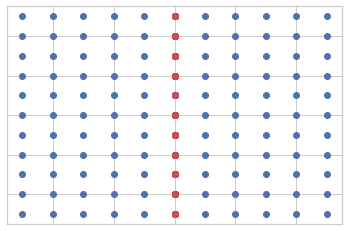

In [93]:
import math
import matplotlib.pyplot as plt

angle_to_north = 0*(math.pi/180)
s = np.array([math.sin(angle_to_north), math.cos(angle_to_north)])

def project(sn, x):
    return sn * (np.dot(x, sn) / np.dot(sn, sn))
    

lat = np.linspace(-5, 5, 11)
lng = np.linspace(-5, 5, 11)
# full coorindate arrays
llng, llat = np.meshgrid(lng, lat, indexing='xy')

plt.scatter(llng, llat)
    
points = np.stack((llng.flatten(),llat.flatten()), axis=1)
ppts = [project(s,points[n,:]) for n in range(0,points.shape[0]) ]

llng, llat = np.stack(ppts, axis=1)

plt.scatter(llng, llat, color='r');
plt.gca().set_xticklabels([]);
plt.gca().set_yticklabels([]);

centroid =  (28.612728, -17.866693 )

df['RelLong'] = df['Longitude'] - centroid[1]
df['RelLat'] = df['Latitude'] - centroid[0]
df.describe()

df['Pos'] = (df['RelLong']*df['RelLong'] + df['RelLat']*df['RelLat'])**(1/2)


def fn(x):
    return -1*x['Pos'] if x['RelLong'] < 0 else x['Pos']

df['Pos'] = df.apply(fn, axis=1)


df.describe()

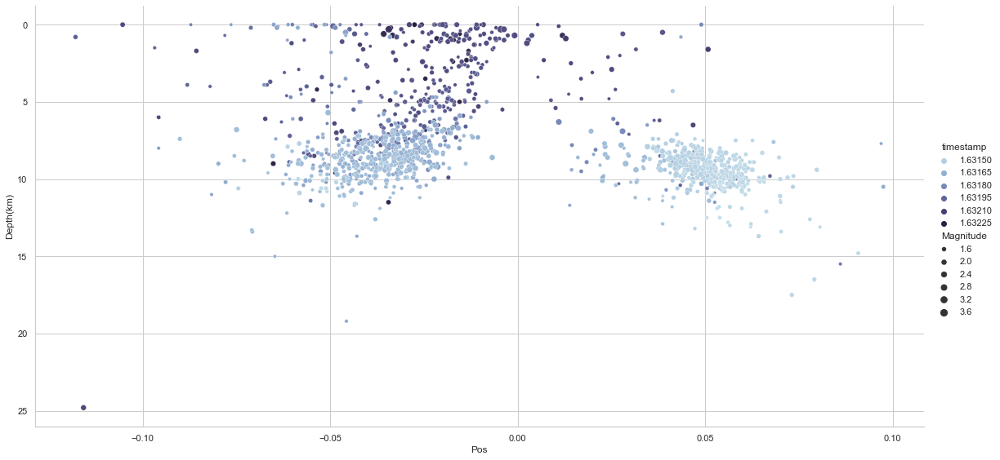

In [95]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
sns.set_theme(style="whitegrid")

def get_numeric_datetime(dt: str):
    return pd.to_numeric(pd.to_datetime([dt]))[0]

sns.relplot(
    data=df[(df['Date'] < '2021-09-22') & (df['Date'] > '2021-09-11')],
    x="Pos", y="Depth(km)",
    hue="timestamp", size="Magnitude", 
    kind="scatter",palette=sns.color_palette("ch:s=.25,rot=-.25", as_cmap=True),
    height=8, aspect=2
)
plt.gca().invert_yaxis()
xticks = plt.gca().get_xticks()